# XY Offset Calculation

This notebook reads Aaron Meisner's reduced and catalog files for the tracking tests run on the CI in mid-April 2019.

We specifically want to check tracking for matched exposures (see below). Just for the heck of it, there are also some examples of grabbing and plotting the data in the reduced files.

In [2]:
import os
from glob import glob
from astropy.io import fits
import numpy as np
from scipy.spatial import cKDTree

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

mpl.rc('font', size=12)

## Reduced and Catalog Files

Grab a list of *all* reduced and catalog files from Aaron Meisner's CI analysis directory. This isn't needed for our test but it shows where the data live.

In [3]:
catalogs = []
reduced = []

dirs = sorted(glob('/project/projectdirs/desi/users/ameisner/CI/reduced/v0000/*'))
for d in dirs:
    subdirs = sorted(glob('{}/*/'.format(d)))
    for sd in subdirs:
        catalogs.extend(sorted(glob('{}/*catalog.fits'.format(sd))))
        reduced.extend(sorted(glob('{}/*reduced.fits'.format(sd))))

0.883333206177 12.5833330154 133.684833984
-6.56666660309 5.33333301544 36.2833328247
-3.59999990463 7.48333358765 38.4333343506
-0.449999928474 9.80000019073 41.7333335876
-5.43333339691 6.36666679382 63.5666656494


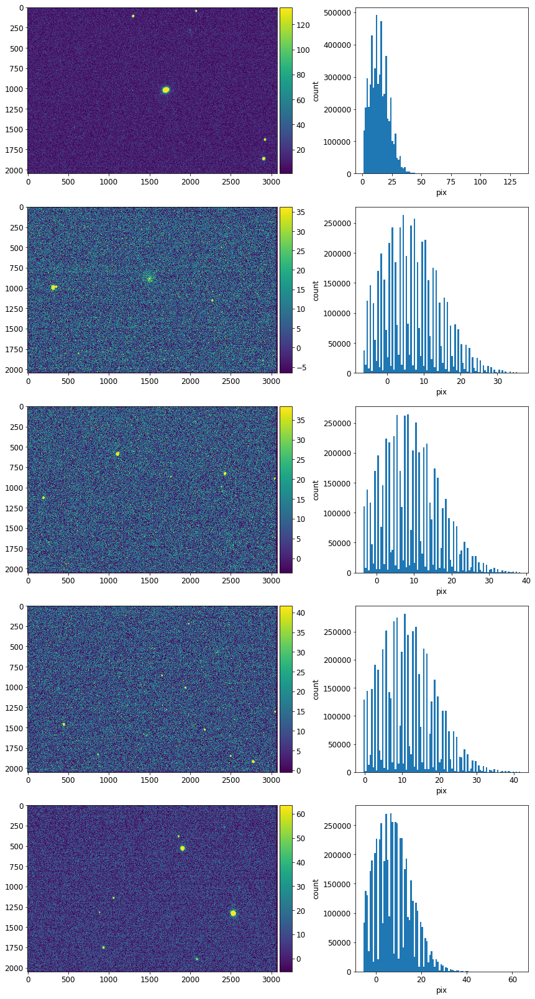

In [4]:
CCDs = ['CIC', 'CIN', 'CIS', 'CIE', 'CIW']

n = len(CCDs)
fig, axes = plt.subplots(n, 2, figsize=(12, 4.5*n),
                         gridspec_kw={'width_ratios':[1.6, 1]})

hdu_r = fits.open(reduced[100])
for j, ccd in enumerate(CCDs):
    data = hdu_r[ccd].data

    values = data.flatten()
    lo, med, hi = np.percentile(values, [10, 50, 99.9])
    print(lo, med, hi)
    ax = axes[j][0]
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    img = ax.imshow(data, cmap='viridis', aspect='equal', interpolation='none', vmin=lo, vmax=hi)
#     ax.set(title=''.format(ccd))
    fig.colorbar(img, cax=cax)
    
    ax = axes[j][1]
    ax.hist(values, bins=np.linspace(lo, hi, 101))
    ax.set(xlabel='pix',
           ylabel='count')
    
fig.tight_layout()

## Compute XY offsets

Compute XY offsets between the following exposure pairs in 20190419:

8078/8080, 8084/8086, 8307/8309, 8310/8312

Match the star centroids found by Aaron between the exposures and compute the $\Delta x$ and $\Delta y$ in pixel space between them.

### KD-Tree Nearest Neighbor Search

In [5]:
def nnsearch(xy1, xy2):
    """KD tree-based nearest neighbor search for points in the xy plane.
    
    Parameters
    ----------
    xy1 : ndarray or list
        2D array of (x,y) values.
    xy2 : ndarray or list
        2D array of other (x,y) values to be matched against xy1.
    
    Returns
    -------
    idx : ndarray
        Integer list in xy2 of points nearest to xy1.
    xy1 : ndarray or list
        Smaller of the two input lists xy1, xy2.
    xy2 : ndarray or list
        Larger of the two input lists xy1, xy2.
    """
    if len(xy1) > len(xy2):
        xy1, xy2 = xy2, xy1
        
    kdtr = cKDTree(xy2)
    dist, idx = kdtr.query(xy1)
    return idx, xy1, xy2

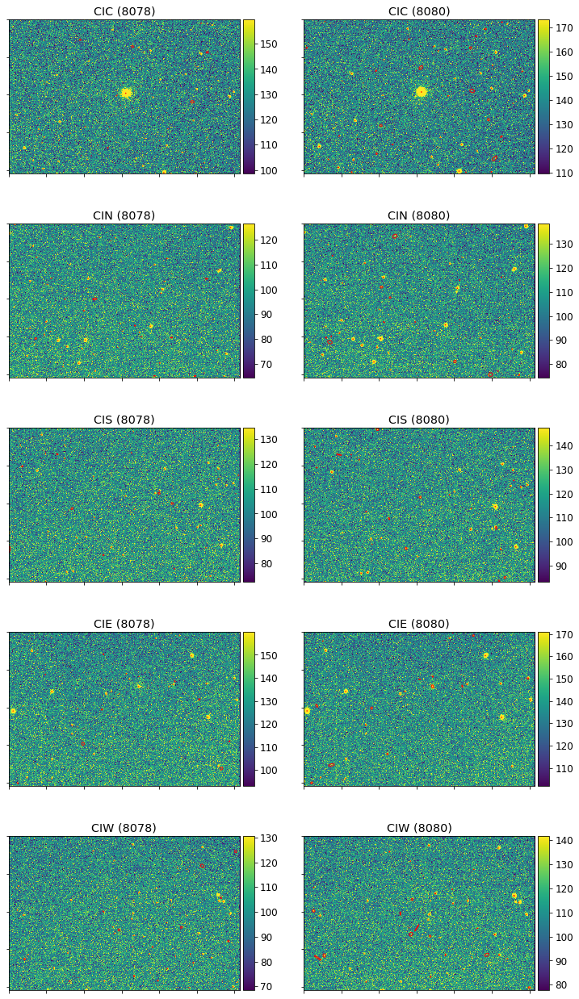

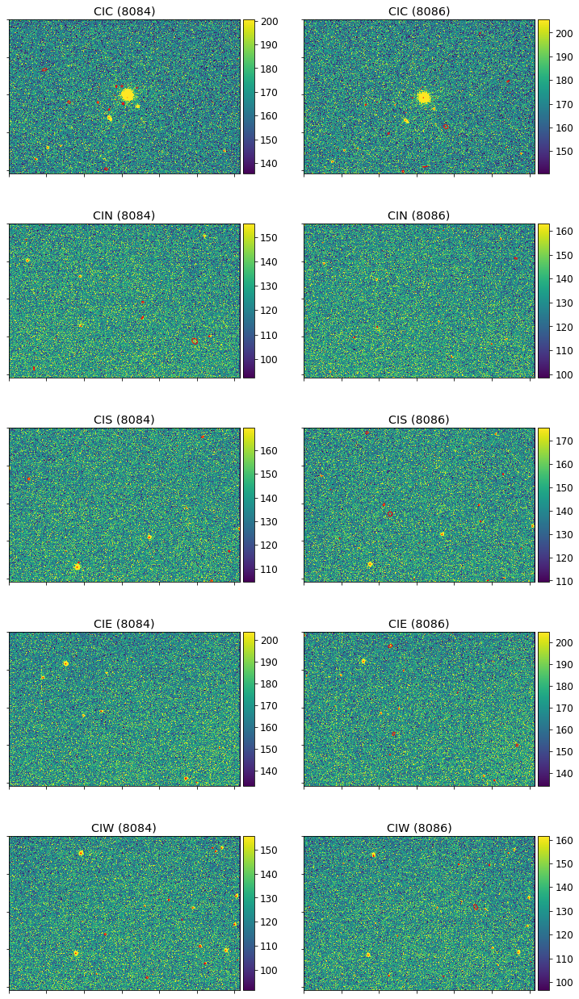

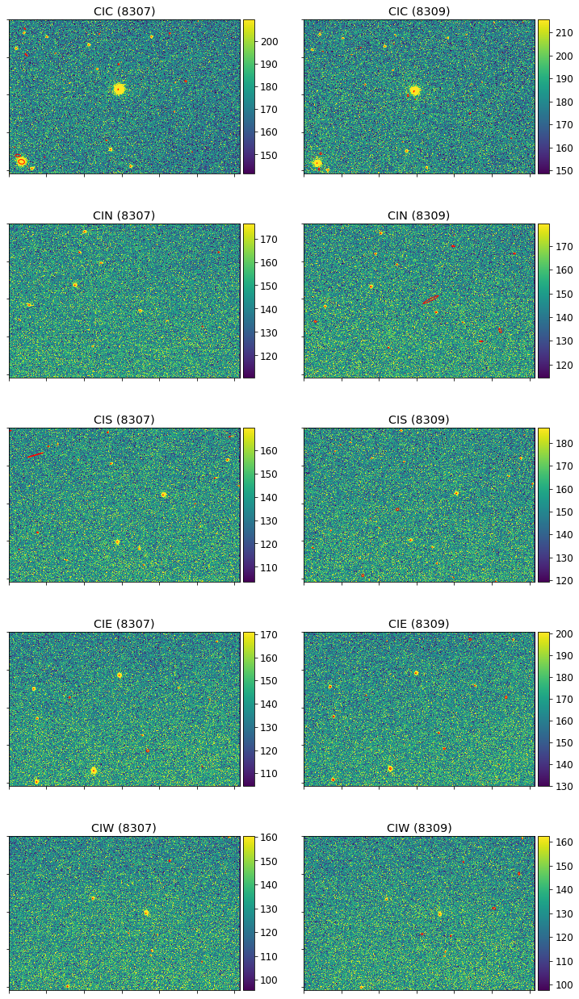

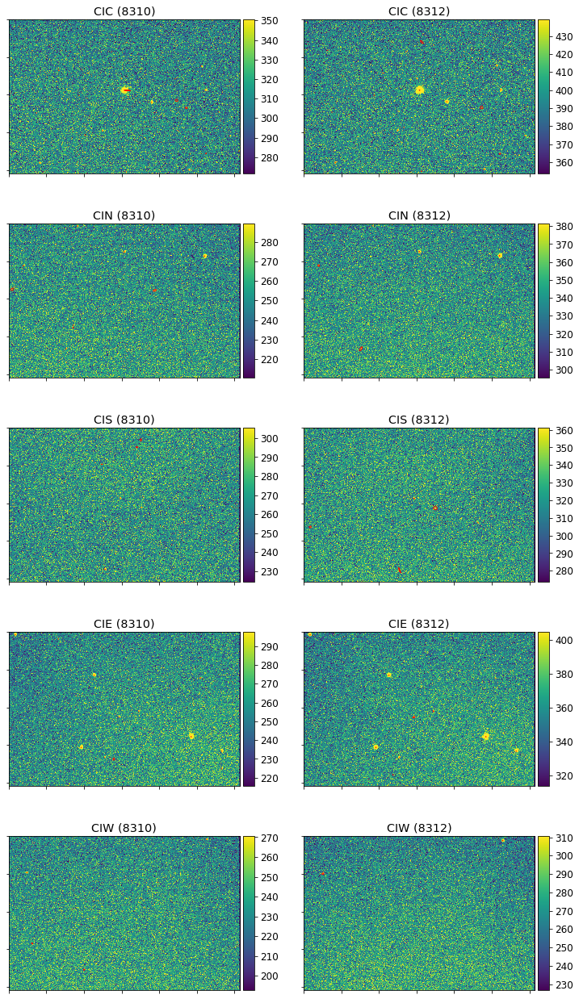

In [6]:
basedir = '/project/projectdirs/desi/users/ameisner/CI/reduced/v0000/20190419'
pairs = [[8078,8080], [8084,8086], [8307,8309], [8310,8312]]
CCDs = ['CIC', 'CIN', 'CIS', 'CIE', 'CIW']
n = len(CCDs)

dx = []
dy = []

# Loop over pairs of observations.
for i, pair in enumerate(pairs):
    # Open the reduced file and catalog for the first observation.
    f1 = '{}/ci-{:08d}/ci-{:08d}_reduced.fits'.format(basedir, pair[0], pair[0])
    hdu1 = fits.open(f1)
    
    c1 = '{}/ci-{:08d}/ci-{:08d}_catalog.fits'.format(basedir, pair[0], pair[0])
    hdu1_c = fits.open(c1)
    cat1 = hdu1_c[1].data
    
    # Open the reduced file and catalog for the second observation.
    f2 = '{}/ci-{:08d}/ci-{:08d}_reduced.fits'.format(basedir, pair[1], pair[1])
    hdu2 = fits.open(f2)
    
    c2 = '{}/ci-{:08d}/ci-{:08d}_catalog.fits'.format(basedir, pair[1], pair[1])
    hdu2_c = fits.open(c2)
    cat2 = hdu2_c[1].data
    
    # Set up plots.
    fig, axes = plt.subplots(5, 2, figsize=(12, n*4.5))
    
    # Loop over CCDs in the two exposures.
    for j, ccd in enumerate(CCDs):
        ccd1 = hdu1[ccd].data
        ccd2 = hdu2[ccd].data
        
        # Plot the image data and ID-ed spots.
        vmin, vmax = np.percentile(ccd1.flatten(), [1,99])  # Use pixel distribution to set plot limits.
        ax = axes[j][0]
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        img = ax.imshow(ccd1, vmin=vmin, vmax=vmax)
        fig.colorbar(img, cax=cax)
        ax.set(title='{} ({:d})'.format(ccd, pair[0]),
               xticklabels=[],
               yticklabels=[])
        
        cut = cat1['camera'] == ccd
        xc1 = cat1['xcentroid'][cut]
        yc1 = cat1['ycentroid'][cut]
        major1  = cat1['sig_major_pix'][cut]
        minor1  = cat1['sig_minor_pix'][cut]
        theta1 = cat1['pos_angle'][cut]
        for x, y, a, b, th in zip(xc1, yc1, major1, minor1, theta1):
            e = mpl.patches.Ellipse((x,y), a, b, th, facecolor='None', edgecolor='r')
            ax.add_patch(e)
                
        # Plot the image data and ID-ed spots.
        vmin, vmax = np.percentile(ccd2.flatten(), [1,99]) # Use pixel distribution to set plot limits.
        ax = axes[j][1]
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        img = ax.imshow(ccd2, vmin=vmin, vmax=vmax)
        fig.colorbar(img, cax=cax)
        ax.set(title='{} ({:d})'.format(ccd, pair[1]),
               xticklabels=[],
               yticklabels=[])
        
        cut = cat2['camera'] == ccd
        xc2 = cat2['xcentroid'][cut]
        yc2 = cat2['ycentroid'][cut]
        major2  = cat2['sig_major_pix'][cut]
        minor2  = cat2['sig_minor_pix'][cut]
        theta2 = cat2['pos_angle'][cut]
        for x, y, a, b, th in zip(xc2, yc2, major2, minor2, theta2):
            e = mpl.patches.Ellipse((x,y), a, b, th, facecolor='None', edgecolor='r')
            ax.add_patch(e)
            
        # Compare centroids and get nearest neighbors.
        idx, xy1, xy2 = nnsearch(np.asarray([xc1,yc1]).T,
                                 np.asarray([xc2,yc2]).T)
        
        # Compute delta-x and delta-y for the centroids.
        for k, (x1,y1) in zip(idx, xy1):
            x2,y2 = xy2[k]
            dx.append(x1 - x2)
            dy.append(y1 - y2)
#             print('{:10.2g} {:10.2g} {:10.2g} {:10.2g}'.format(x1, x2, y1, y2))

#     break


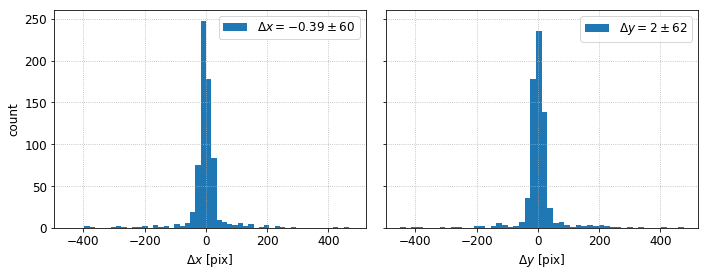

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(10,4), sharex=True, sharey=True)
ax = axes[0]
m, s = np.mean(dx), np.std(dx)
ax.hist(dx, bins=50, label=r'$\Delta x={{{:.2g}}}\pm{{{:.2g}}}$'.format(m, s))
ax.set(xlabel=r'$\Delta x$ [pix]',
       ylabel='count')
leg = ax.legend()
ax.grid(ls=':')

ax = axes[1]
m, s = np.mean(dy), np.std(dy)
ax.hist(dy, bins=50, label=r'$\Delta y={{{:.2g}}}\pm{{{:.2g}}}$'.format(m, s))
ax.set(xlabel=r'$\Delta y$ [pix]')
leg = ax.legend()
ax.grid(ls=':')

fig.tight_layout()